### SUPPORT VECTOR MACHINES

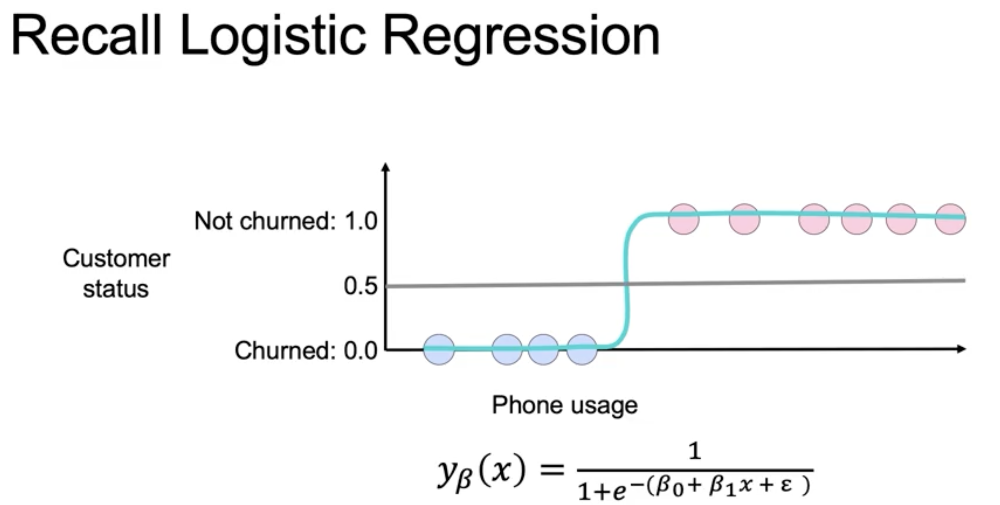

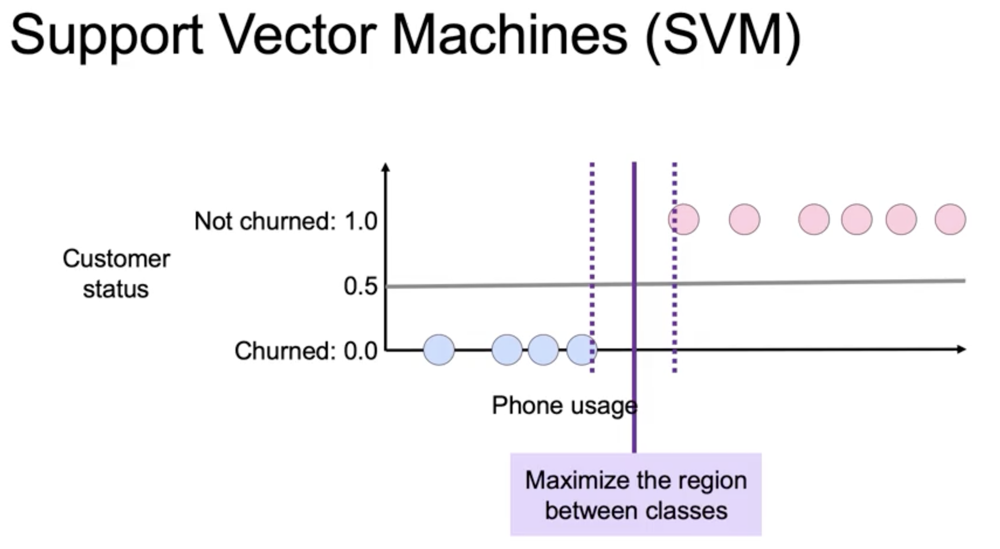

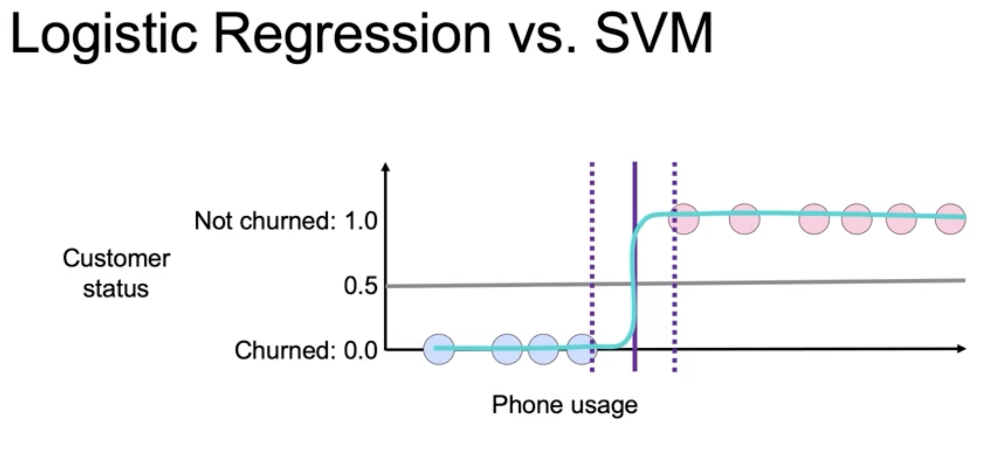

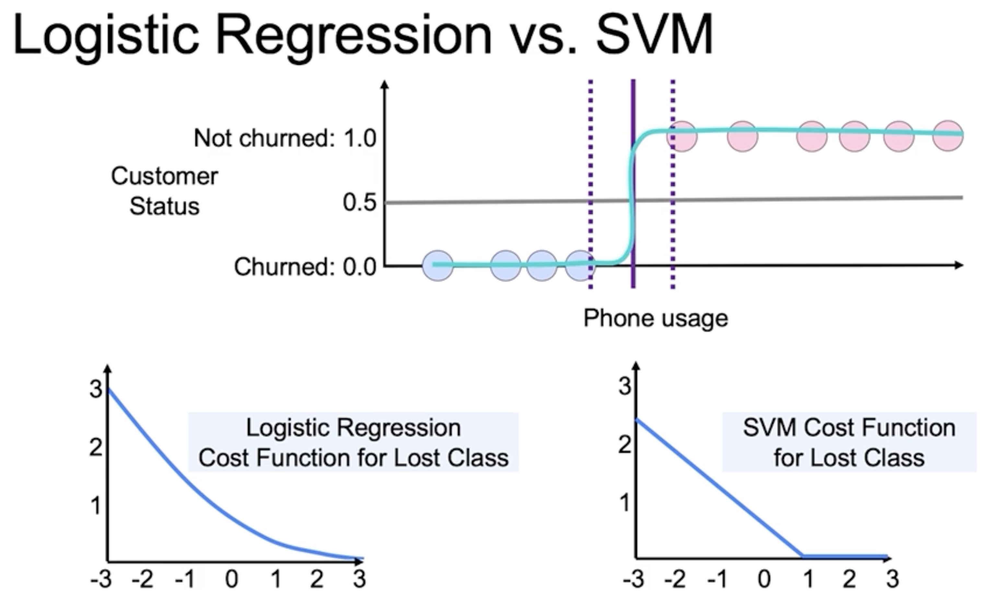

In [1]:
from IPython.display import Image, display

display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/lr_1.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/lr_2.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/lr_3.png"))
display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/lr_4.png"))

In [1]:
# Linear SVM: The Syntax

# import the class containing the classification method
from sklearn.svm import LinearSVC

In [2]:
# regularization parameters

# create an instance of the class
LinSVC = LinearSVC(penalty = '12', C=10.0)

In [ ]:
# Fit the intance on the data and then predict the expected value
LinSVC = LinSVC.fit(X_train, y_train)
y_predict = LinSVC.predict(X_test)

# Tune regularization parameters with cross-validation
# Use "LinearSVM for regression" rather than "Linear SVC for classification".

#### Support Vector Machines Gaussian Kernels

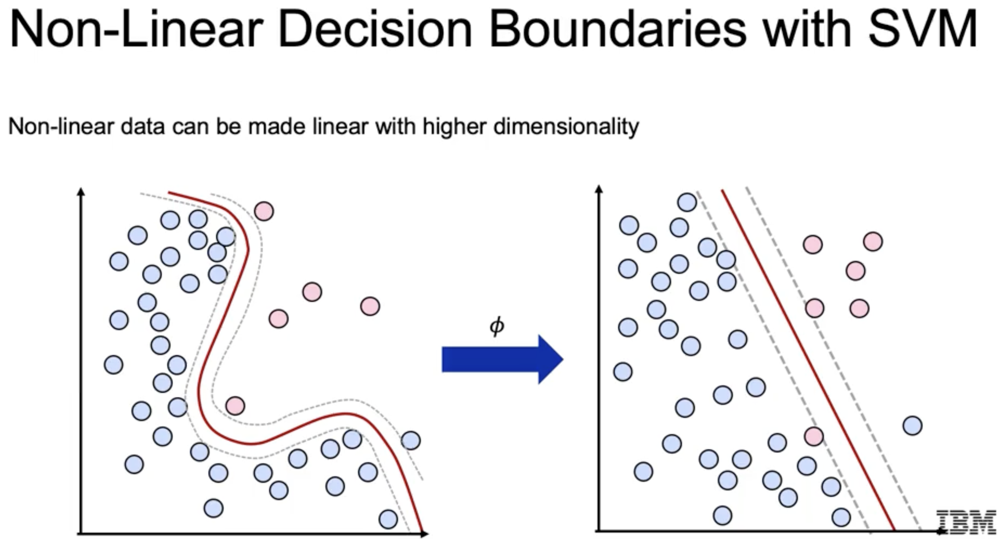

In [3]:
from IPython.display import Image, display

display(Image(filename="/Users/cansezgin/Python-Output/SAMPLE_TRAINING_DATA/lr_5.png"))

#### SUPPORT VECTOR MACHINES EXAMPLE

##### PART I: SETUP

* I use a wine quality dataset for this example. This dataset contains various chemical properties of wine, such as acidity, sugar, pH, and alcohol. It also contains a quality metric (3-9, with highest being better) and a color (red or white).

In [9]:
# import libraries and suppress warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [10]:
# import the dataset
data = pd.read_csv("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML241EN-SkillsNetwork/labs/datasets/Wine_Quality_Data.csv", sep=',')

In [14]:
# Create the target variable y as a 1/0 column where 1 means red.

y = (data['color'] == 'red').astype(int)
fields = list(data.columns[:-1]) #everything except "color"
correlations = data[fields].corrwith(y)
correlations.sort_values(inplace=True)
correlations

total_sulfur_dioxide   -0.700357
free_sulfur_dioxide    -0.471644
residual_sugar         -0.348821
citric_acid            -0.187397
quality                -0.119323
alcohol                -0.032970
pH                      0.329129
density                 0.390645
fixed_acidity           0.486740
sulphates               0.487218
chlorides               0.512678
volatile_acidity        0.653036
dtype: float64

In [15]:
# Create a pairplot for the dataset.

sns.set_context('talk')
#sns.set_palette(palette)
sns.set_style('white')

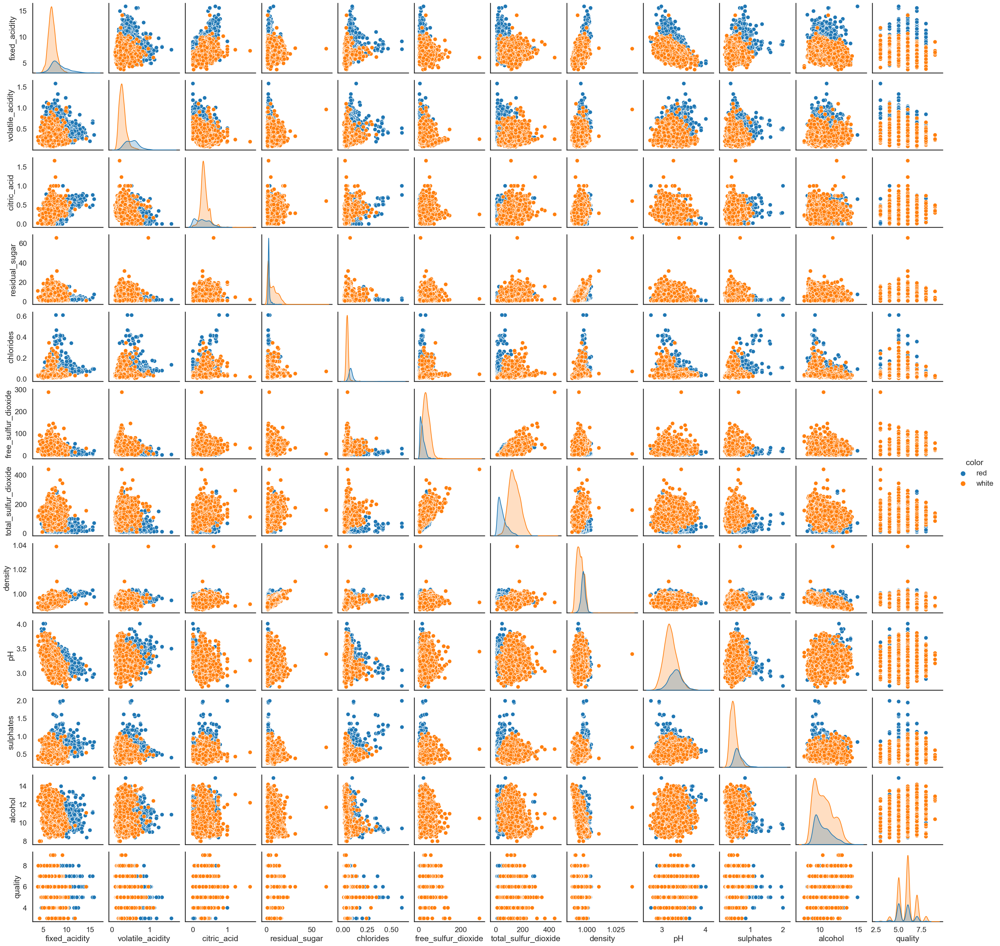

In [16]:
sns.pairplot(data, hue='color')

[(-1.0, 1.0), Text(0, 0.5, 'pearson correlation')]

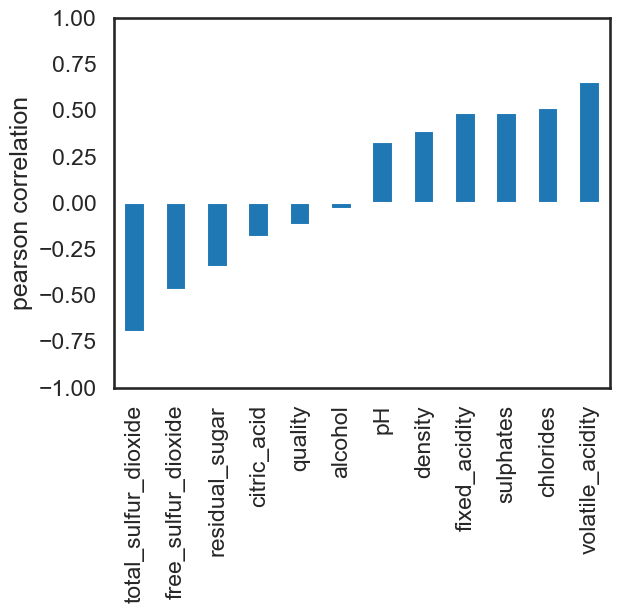

In [17]:
# Create a bar plot showing the correlations between each column and y

ax = correlations.plot(kind='bar')
ax.set(ylim=[-1,1], ylabel='pearson correlation')

In [22]:
# Pick the most 2 correlated fields 
# (using the absolute value of correlations) and create X.

from sklearn.preprocessing import MinMaxScaler

fields = correlations.map(abs).sort_values().iloc[-2:].index
print(fields)

# Use MinMaxScaler to scale X. Note that this will output a np.array. 
# Make it a DataFrame again and rename the columns appropriately.

X = data[fields]
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = pd.DataFrame(X, columns=['%s_scaled' % fld for fld in fields])
print(X.columns)


Index(['volatile_acidity', 'total_sulfur_dioxide'], dtype='object')
Index(['volatile_acidity_scaled', 'total_sulfur_dioxide_scaled'], dtype='object')


##### PART II: LINEAR DECISION BOUNDARY

- The goal is to look at the decision boundary of a LinearSVC classifier on this dataset.

- Fit a Linear Support Vector Machine Classifier to X, y.
- Pick 300 samples from X. Get the corresponding y value. Store them in variables X_color and y_color. This is because original dataset is too large and it produces a crowded plot.
- Modify y_color so that it has the value "red" instead of 1 and 'yellow' instead of 0.
- Scatter plot X_color's columns. Use the keyword argument "color=y_color" to color code samples.

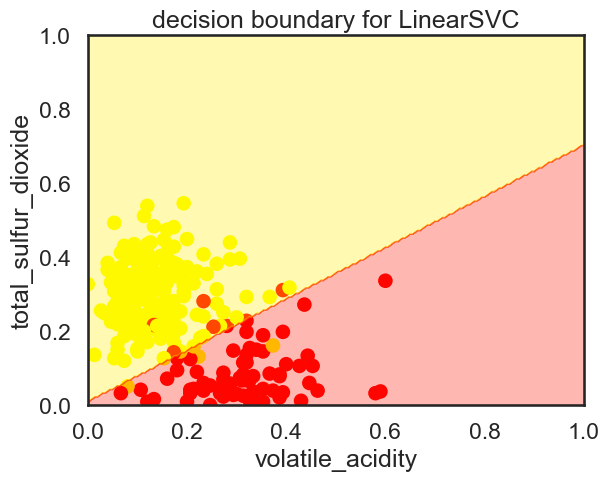

In [23]:
from sklearn.svm import LinearSVC

LSVC = LinearSVC()
LSVC.fit(X, y)

X_color = X.sample(300, random_state=45)
y_color = y.loc[X_color.index]
y_color = y_color.map(lambda r: 'red' if r == 1 else 'yellow')
ax = plt.axes()
ax.scatter(
    X_color.iloc[:, 0], X_color.iloc[:, 1],
    color=y_color, alpha=1)
# -----------
x_axis, y_axis = np.arange(0, 1.005, .005), np.arange(0, 1.005, .005)
xx, yy = np.meshgrid(x_axis, y_axis)
xx_ravel = xx.ravel()
yy_ravel = yy.ravel()
X_grid = pd.DataFrame([xx_ravel, yy_ravel]).T
y_grid_predictions = LSVC.predict(X_grid)
y_grid_predictions = y_grid_predictions.reshape(xx.shape)
ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.autumn_r, alpha=.3)
# -----------
ax.set(
    xlabel=fields[0],
    ylabel=fields[1],
    xlim=[0, 1],
    ylim=[0, 1],
    title='decision boundary for LinearSVC');

##### PART III: GAUSSIAN KERNEL

Let's now fit a Gaussian kernel SVC and see how the decision boundary changes.

* Consolidate the code snippets above into one function which takes in an estimator, `X` and `y`, and produces the final plot with decision boundary. The steps are:
    <ol>
     <li> Fit model
     <li> Get sample 300 records from X and the corresponding y's
     <li> Create grid, predict, plot using ax.contourf
     <li> Add on the scatter plot
    </ol>
* the finished function uses the input `estimator` and not the LinearSVC model.
* For the following values of `gamma`, create a Gaussian Kernel SVC and plot the decision boundary.  
`gammas = [.5, 1, 2, 10]`
* Holding `gamma` constant, we plot the decision boundary for various values of `C`: 
`[.1, 1, 10]`


In [24]:
def plot_decision_boundary(estimator, X, y):
    estimator.fit(X, y)
    X_color = X.sample(300)
    y_color = y.loc[X_color.index]
    y_color = y_color.map(lambda r: 'red' if r == 1 else 'yellow')
    x_axis, y_axis = np.arange(0, 1, .005), np.arange(0, 1, .005)
    xx, yy = np.meshgrid(x_axis, y_axis)
    xx_ravel = xx.ravel()
    yy_ravel = yy.ravel()
    X_grid = pd.DataFrame([xx_ravel, yy_ravel]).T
    y_grid_predictions = estimator.predict(X_grid)
    y_grid_predictions = y_grid_predictions.reshape(xx.shape)

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.autumn_r, alpha=.3)
    ax.scatter(X_color.iloc[:, 0], X_color.iloc[:, 1], color=y_color, alpha=1)
    ax.set(
        xlabel=fields[0],
        ylabel=fields[1],
        title=str(estimator))

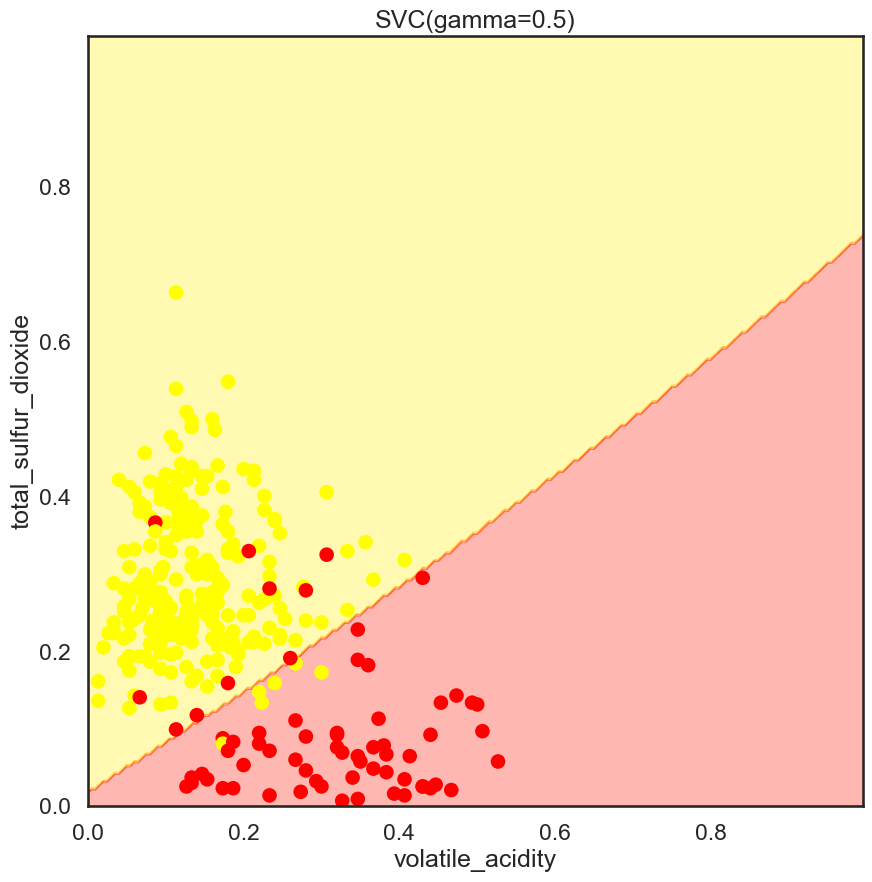

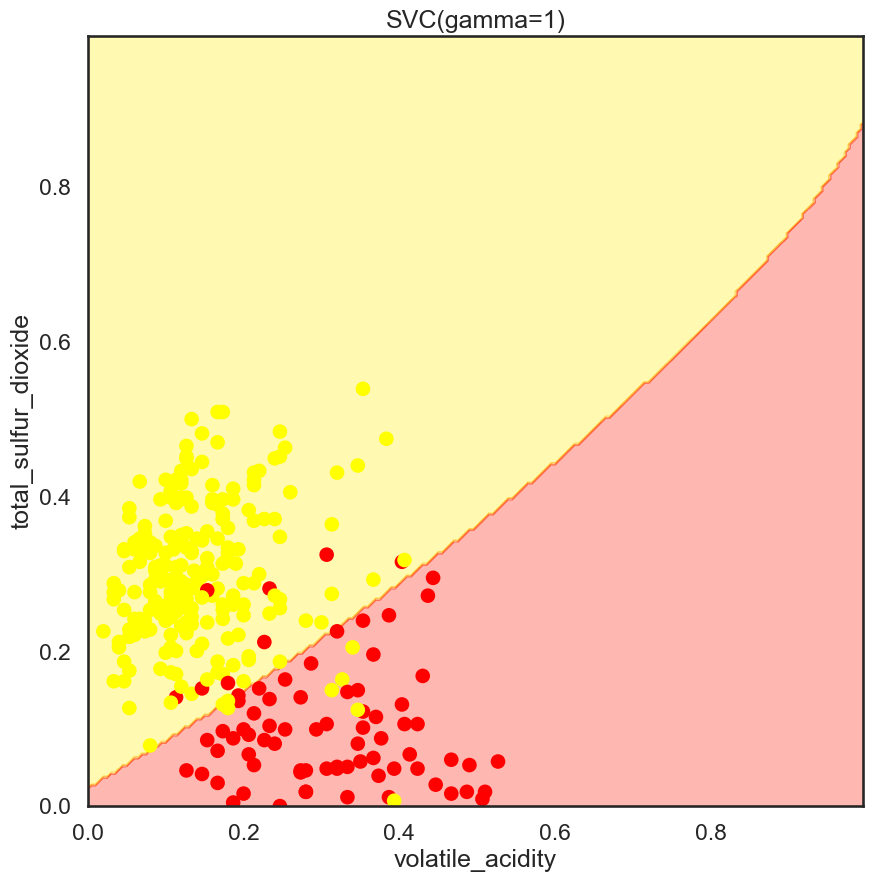

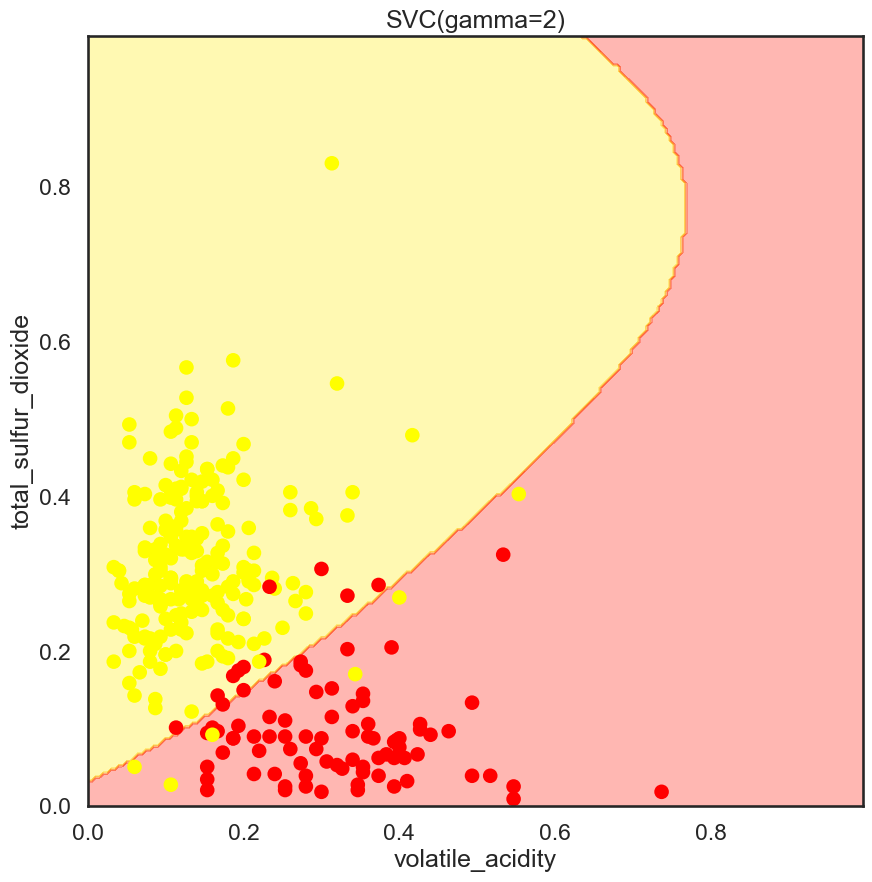

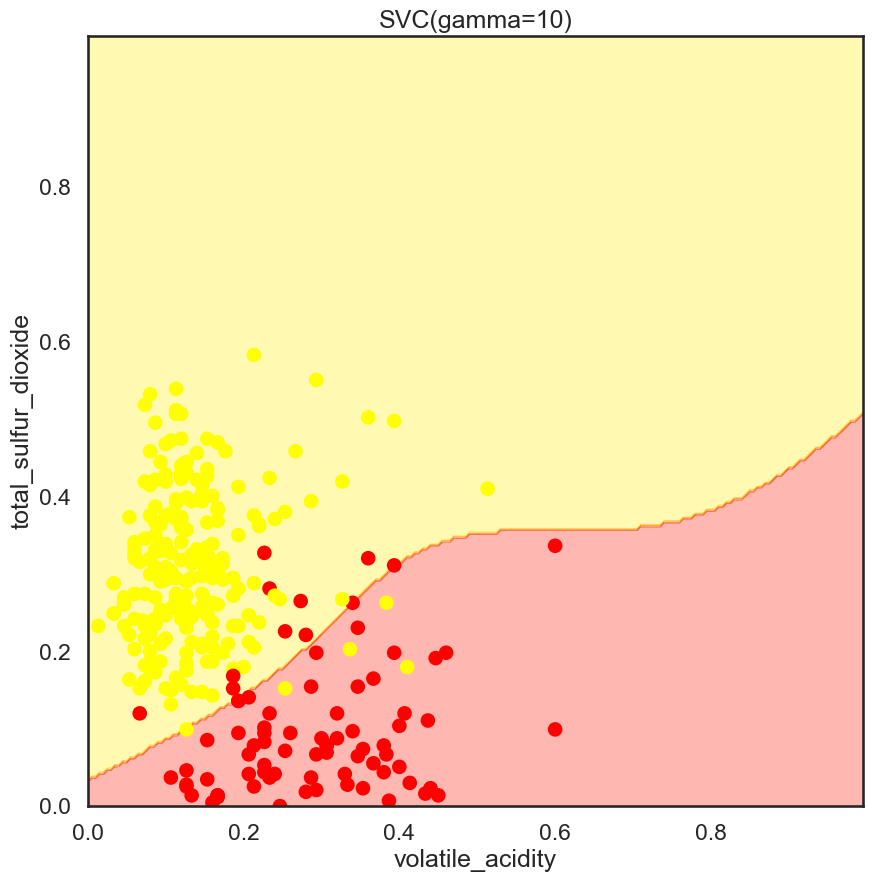

In [25]:
from sklearn.svm import SVC

gammas = [.5, 1, 2, 10]
for gamma in gammas:
    SVC_Gaussian = SVC(kernel='rbf', gamma=gamma)
    plot_decision_boundary(SVC_Gaussian, X, y)

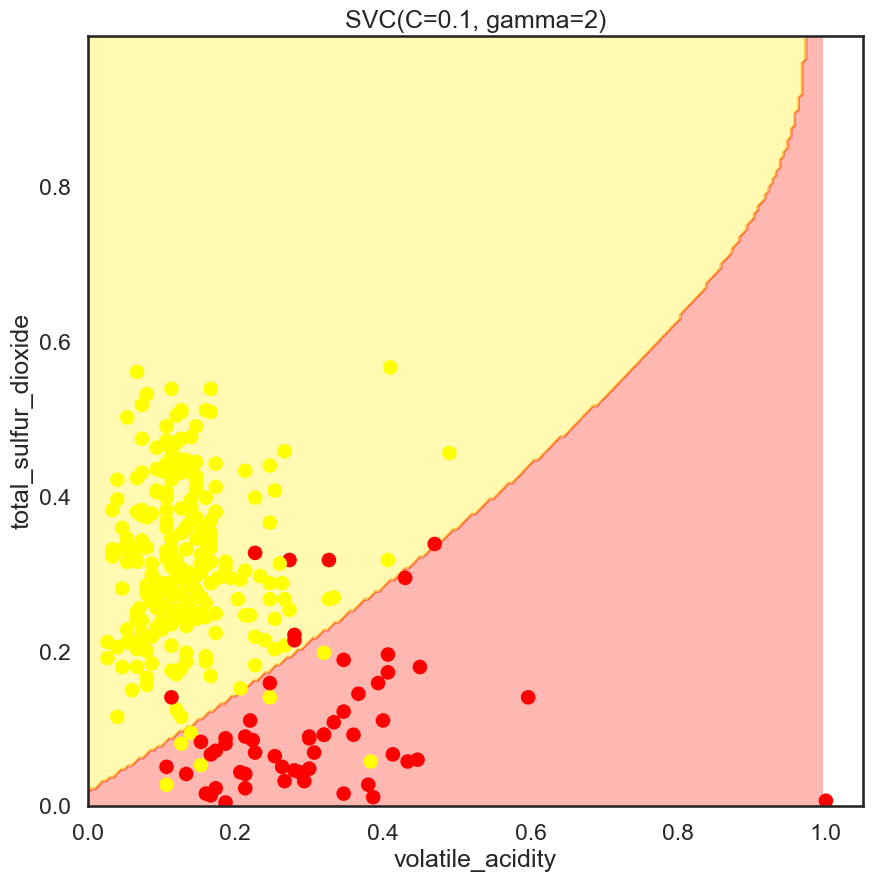

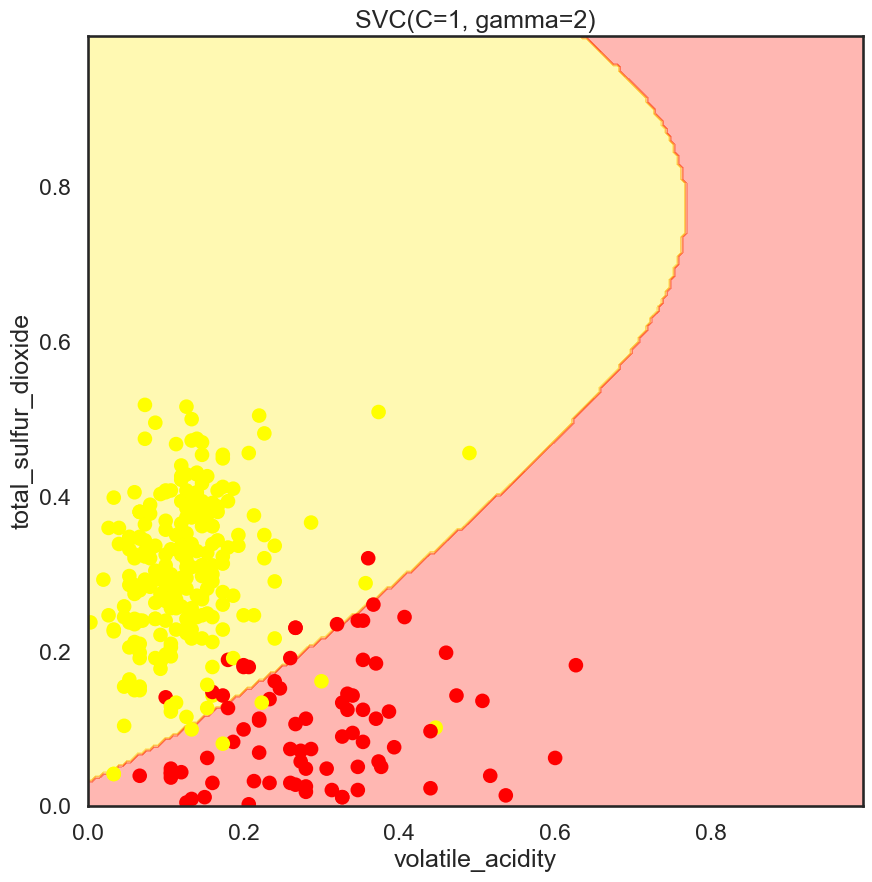

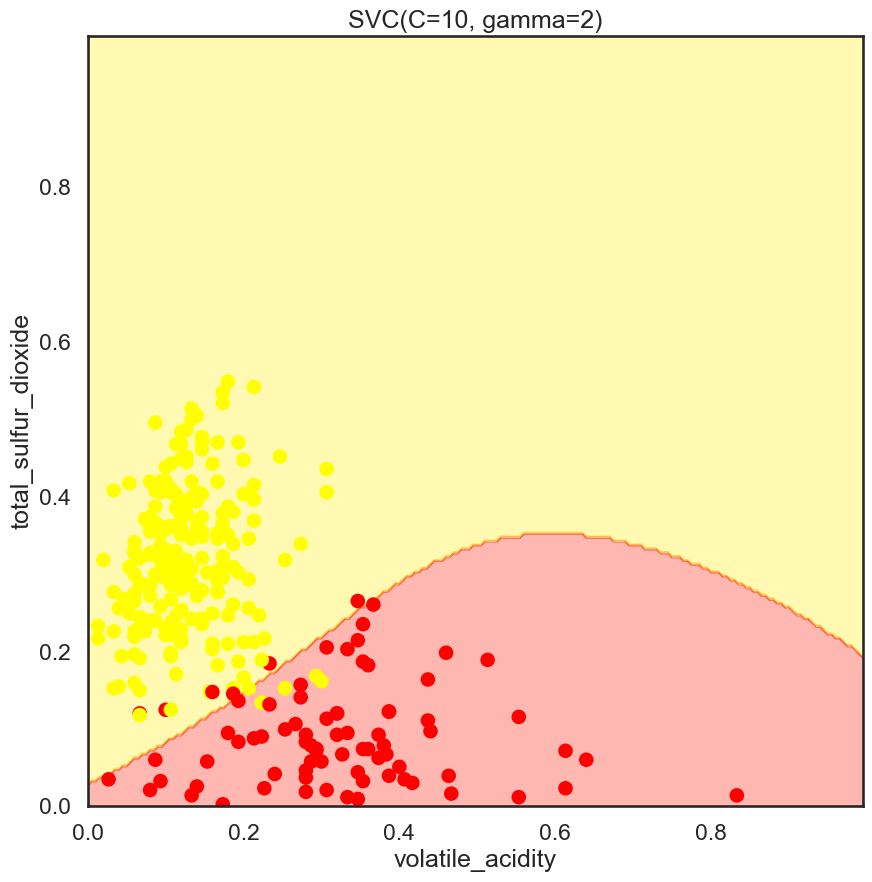

In [26]:
Cs = [.1, 1, 10]
for C in Cs:
    SVC_Gaussian = SVC(kernel='rbf', gamma=2, C=C)
    plot_decision_boundary(SVC_Gaussian, X, y)

##### PART IV: COMPARING KERNEL EXECUTION TIMES

Jupyter Notebooks provide a useful magic function **`%timeit`** which executes a line and prints out the time it took to fit. If we type **`%%timeit`** in the beginning of the cell, it will output the execution time.

Let's proceed with the following steps:
* Create `y` from data.color, and `X` from the rest of the columns.
* Use `%%timeit` to get the time for fitting an SVC with rbf kernel.
* Use `%%timeit` to get the time for the following: fit_transform the data with Nystroem and then fit a SGDClassifier.

In [27]:
from sklearn.kernel_approximation import Nystroem
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier

y = data.color == 'red'
X = data[data.columns[:-1]]

kwargs = {'kernel': 'rbf'}
svc = SVC(**kwargs)
nystroem = Nystroem(**kwargs)
sgd = SGDClassifier()

In [28]:
%%timeit
svc.fit(X, y)

104 ms ± 542 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [29]:
%%timeit
X_transformed = nystroem.fit_transform(X)
sgd.fit(X_transformed, y)

41 ms ± 4.45 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [30]:
X2 = pd.concat([X]*5)
y2 = pd.concat([y]*5)

print(X2.shape)
print(y2.shape)

(32485, 12)
(32485,)


In [31]:
%timeit svc.fit(X2, y2)

2.39 s ± 29.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [ ]:
%%timeit
X2_transformed = nystroem.fit_transform(X2)
sgd.fit(X2_transformed, y2)

In [32]:
%%timeit
X2_transformed = nystroem.fit_transform(X2)
sgd.fit(X2_transformed, y2)

178 ms ± 27.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
